In [1]:
import os
import os.path as osp
import sys
import numpy as np
import torch, torchvision
from torch import nn
from torch.utils import model_zoo
from torch.nn.parallel import DataParallel
from torch.utils.data import DataLoader
from torch.utils.data.dataset import ConcatDataset
import mmcv
# %load_ext autoreload
# %autoreload 2

import sys
sys.path.append('/home/damon/detorch/')
from visualization_utils import *
from debug_utils import *

# Validate visualize coco dataset

In [3]:
# Conver json['annotations'] to boxes
def get_gt_boxes_from_img_name_COCO(json_ann, image_name):
    image_id = None
    for im in json_ann['images']:
        if im['file_name'] != image_name:
            continue
        else:
            image_id = im['id']
            break
    print(image_id)
    if image_id == None:
        raise ValueError("Not found")
    boxes = []
    for info in json_ann['annotations']:
        if info['image_id'] == image_id:
            x1, y1, w, h = info['bbox']
            bbox = [y1, x1, y1 + h, x1 + w]
            boxes.append(bbox)
    return np.asarray(boxes)

In [11]:
coco_imgs = '/home/damon/DATASETS/COCO/val2017/'
coco_anno_file = '/home/damon/DATASETS/COCO/annotations/instances_val2017.json'
coco_annos = mmcv.load(coco_anno_file)
images = coco_annos['images']
annotations = coco_annos['annotations']
all_ids = [q['image_id'] for q in annotations]
id2fname = {v['id']: v['file_name'] for v in coco_annos['images'] if v['id'] in all_ids}
fname2id = {fn: id for id, fn in id2fname.items()}
# find name by id
ind = np.random.randint(len(id2fname.keys()))
example_img = id2fname[all_ids[ind]]
print(example_img)
example_img_full_path = osp.join(coco_imgs, example_img)
boxes = get_gt_boxes_from_img_name_COCO(coco_annos, example_img)

000000529568.jpg
529568


In [12]:
img = mmcv.imread(example_img_full_path)

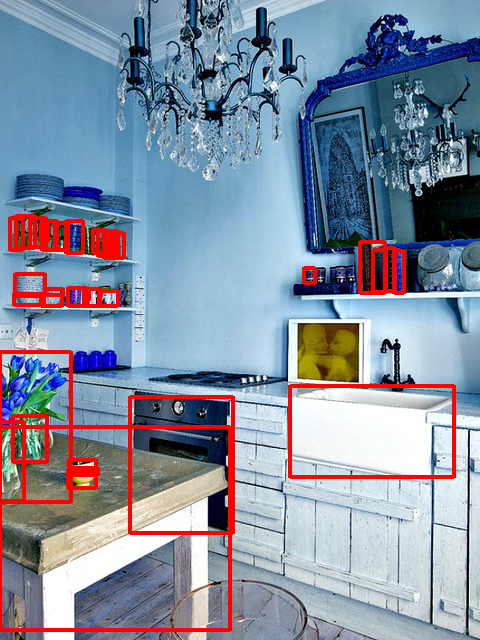

In [13]:
draw_bounding_boxes_on_image_array(img, boxes)
visualize_image_array(img)

# Vissualize visdrone dataset

In [47]:
ann = '/home/damon/DATASETS/Drone2019/VisDrone2019-DET/VisDrone2018-DET-val/annotations_val.json'
imgs = '/home/damon/DATASETS/Drone2019/VisDrone2019-DET/VisDrone2018-DET-val/images'
gts = mmcv.load(ann)

img_name = np.random.choice(os.listdir(imgs))
img_full = osp.join(imgs, img_name)
img_arr = mmcv.imread(img_full)
img_name = osp.join('images', img_name)
boxes = get_gt_boxes_from_img_name_COCO(gts, img_name)

40851702


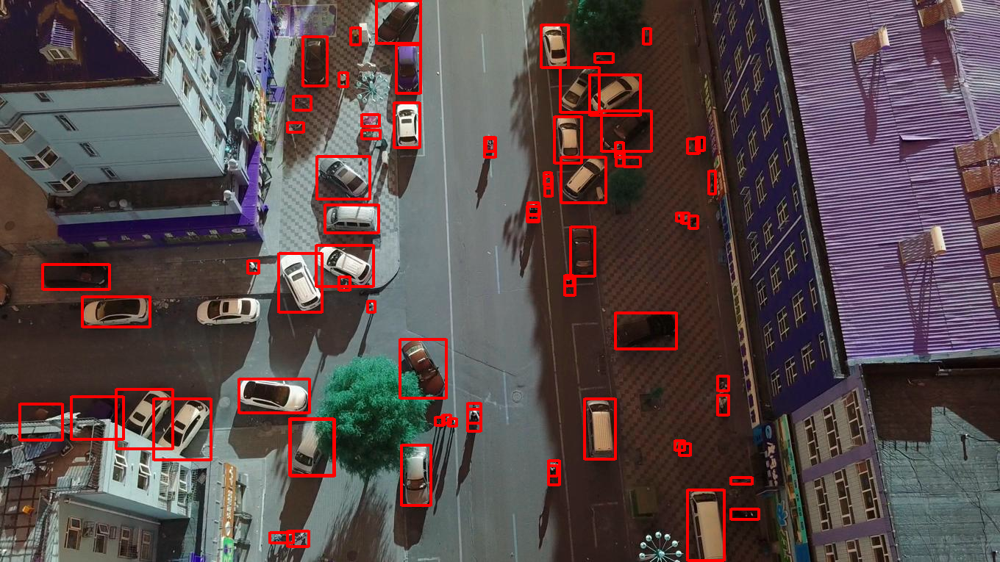

In [48]:
draw_bounding_boxes_on_image_array(img_arr, boxes)
visualize_image_array(img_arr)

# Vis train

In [42]:
ann = '/home/damon/DATASETS/Drone2019/VisDrone2019-DET/VisDrone2018-DET-train/annotations_train.json'
imgs = '/home/damon/DATASETS/Drone2019/VisDrone2019-DET/VisDrone2018-DET-train/images'
gts = mmcv.load(ann)

img_name = np.random.choice(os.listdir(imgs))
img_full = osp.join(imgs, img_name)
img_arr = mmcv.imread(img_full)
img_name = osp.join('images', img_name)
boxes = get_gt_boxes_from_img_name_COCO(gts, img_name)

97553336


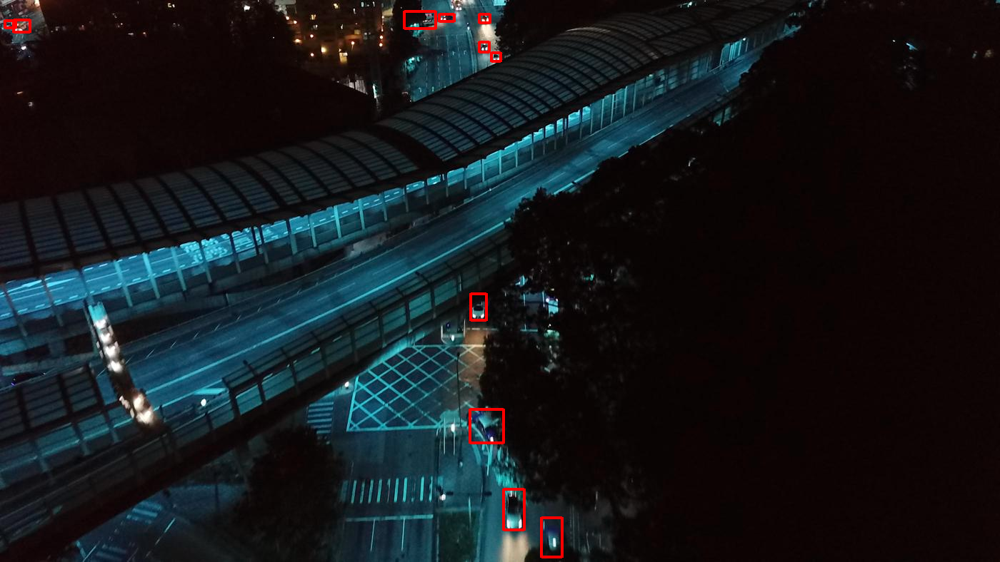

In [43]:
draw_bounding_boxes_on_image_array(img_arr, boxes)
visualize_image_array(img_arr)

# Vis debug

In [45]:
ann = '/tmp/visdrone-debug/annotations_debug.json'
imgs = '/tmp/visdrone-debug/images'
gts = mmcv.load(ann)

img_name = np.random.choice(os.listdir(imgs))
img_full = osp.join(imgs, img_name)
img_arr = mmcv.imread(img_full)
img_name = osp.join('images', img_name)
boxes = get_gt_boxes_from_img_name_COCO(gts, img_name)

50078606


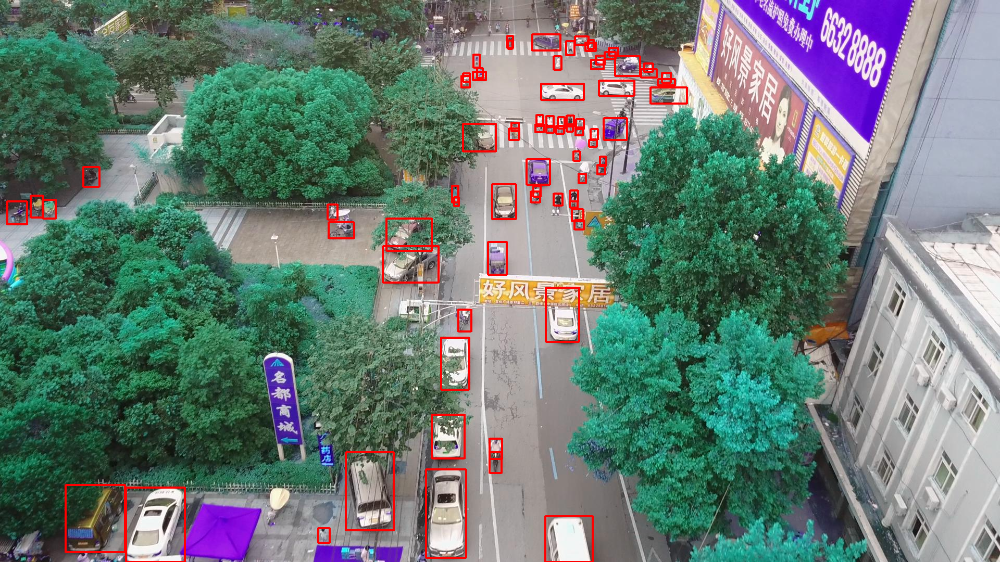

In [46]:
draw_bounding_boxes_on_image_array(img_arr, boxes)
visualize_image_array(img_arr)

# VID

30902045


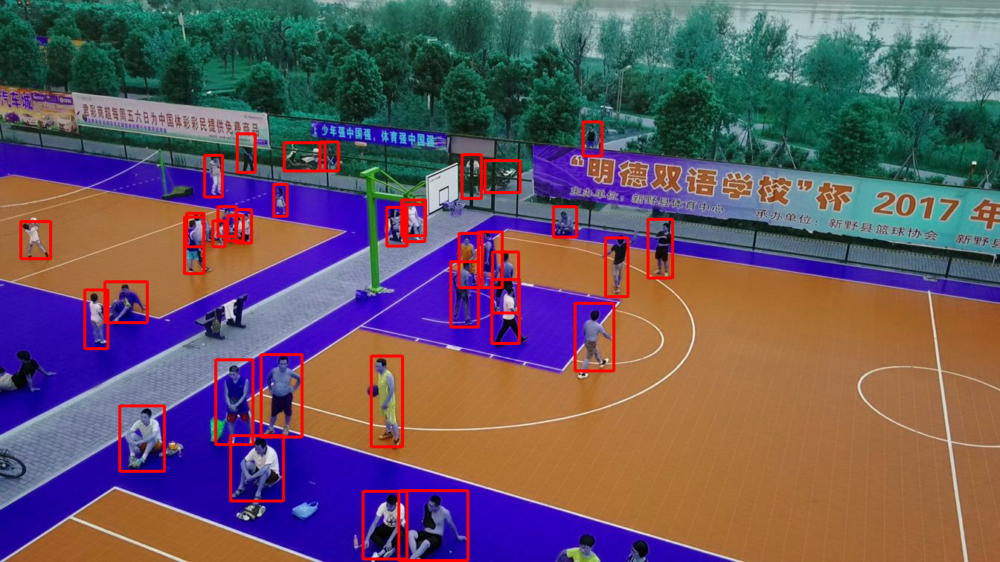

In [13]:
ann = '/home/damon/volatile/VisDrone2019-VID/VisDrone2018-VID-val-DET/annotations_val.json'
imgs = '/home/damon/volatile/VisDrone2019-VID/VisDrone2018-VID-val-DET/images'
gts = mmcv.load(ann)

img_name = np.random.choice(os.listdir(imgs))
img_full = osp.join(imgs, img_name)
img_arr = mmcv.imread(img_full)
img_name = osp.join('images', img_name)
boxes = get_gt_boxes_from_img_name_COCO(gts, img_name)

ret = draw_bounding_boxes_on_image_array(img_arr, boxes)
visualize_image_array(ret)